In [ ]:
from google.colab import drive
drive.mount('/content/gdrive/')

Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).


In [ ]:
import numpy as np
import cv2 as cv
from google.colab.patches import cv_imshow

In [ ]:
# Read images and points
im_src = cv.imread('gdrive/MyDrive/MachineVision/as/python.jpg');
size = im_src.shape
pts_src = np.array([[0,0],[size[1]-1,0],[size[1]-1,size[0]-1],[0,size[0]-1]],dtype=float);
im_dst = cv.imread('gdrive/MyDrive/MachineVision/as/subway.jpg');
pts_dst = np.array([[513,371],[883,355],[873,867],[507,724]],dtype=float);

(533, 800, 3)


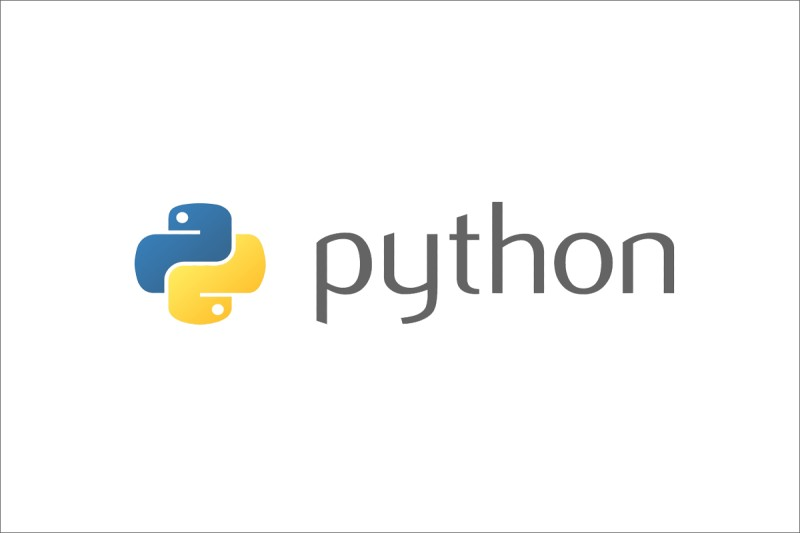

(900, 1598, 3)


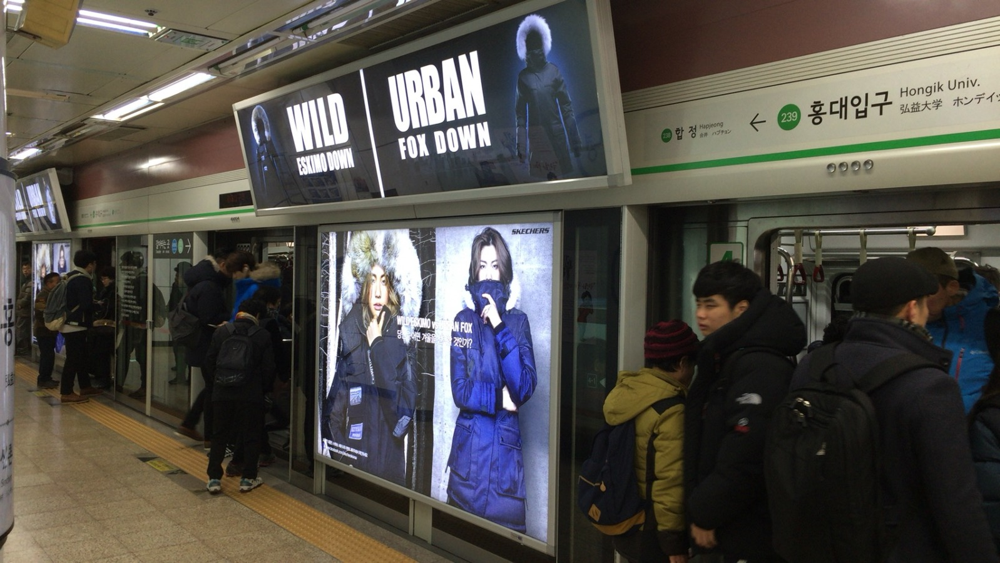

In [ ]:
print(im_src.shape)
cv_imshow(im_src)
print(im_dst.shape)
cv_imshow(im_dst)

In [ ]:
im_src = cv.imread('gdrive/MyDrive/MachineVision/as/python.jpg')
x=np.array([[0,0,1],[size[1]-1,0,1],[size[1]-1,size[0]-1,1],[0,size[0]-1,1]])
im_dst = cv.imread('gdrive/MyDrive/MachineVision/as/subway.jpg')
x_=np.array([[513,371,1],[883,355,1],[873,867,1],[507,724,1]])

A1 = np.hstack((np.zeros((len(x_),3)),
                -np.expand_dims(x_[:,2],axis=1)*x,
                np.expand_dims(x_[:,1],axis=1)*x))
A2 = np.hstack((np.expand_dims(x_[:,2],axis=1)*x,
                np.zeros((len(x_),3)),
                -np.expand_dims(x_[:,0],axis=1)*x))
A = np.vstack((A1, A2))
u, s, vh = np.linalg.svd(A, full_matrices=True)
h = vh[-1,:]/vh[-1,-1];
h = np.reshape(h,(3,3))
print(h)

[[ 1.19135067e-01 -8.96661394e-03  5.13000000e+02]
 [-1.58303675e-01  6.66834791e-01  3.71000000e+02]
 [-3.89517306e-04  4.55933239e-06  1.00000000e+00]]


In [ ]:
# Calculate Homography between source and destination points
h, status = cv.findHomography(pts_src, pts_dst);
print(h)
print(status)

[[ 1.19135067e-01 -8.96661398e-03  5.13000000e+02]
 [-1.58303675e-01  6.66834791e-01  3.71000000e+02]
 [-3.89517306e-04  4.55933236e-06  1.00000000e+00]]
[[1]
 [1]
 [1]
 [1]]


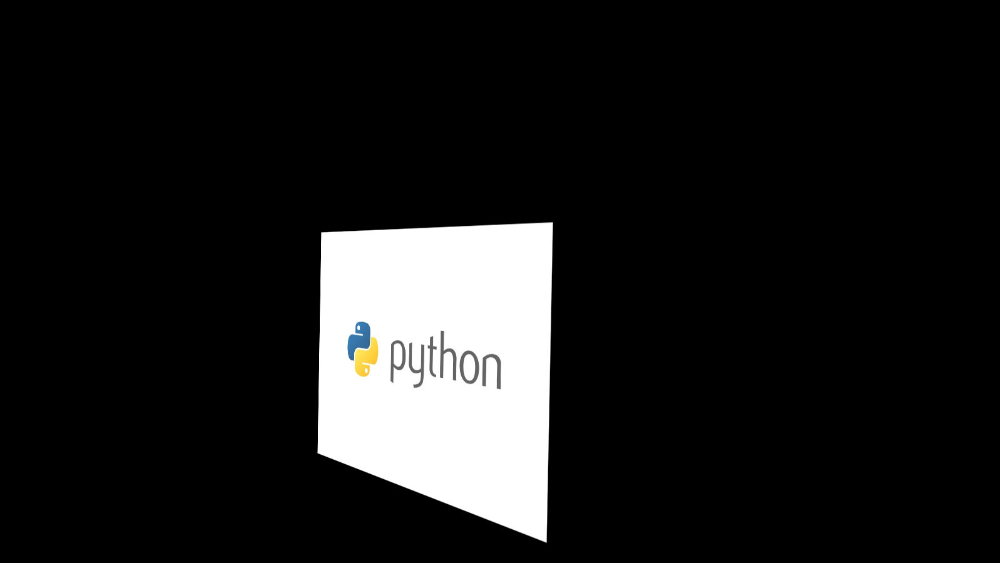

In [ ]:
# Warp source image
im_temp = cv.warpPerspective(im_src, h, (im_dst.shape[1],im_dst.shape[0]))
cv_imshow(im_temp)

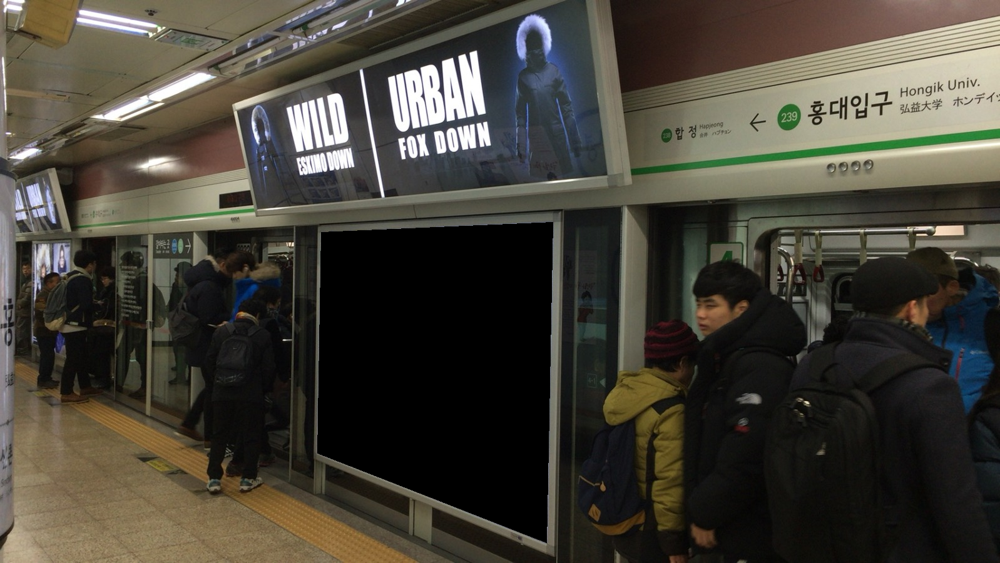

In [ ]:
# Black out polygonal area in destination image.
cv.fillConvexPoly(im_dst, pts_dst.astype(int), 0);
cv_imshow(im_dst)

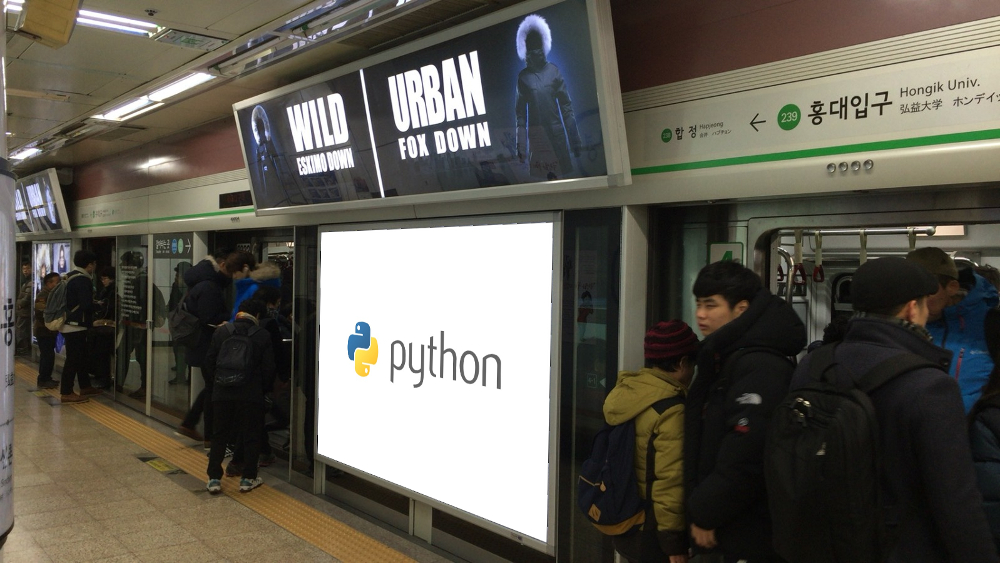

In [ ]:
# Add warped source image to destination image.
im_dst = im_dst + im_temp;
# Display image.
cv_imshow(im_dst);

In [ ]:
import subprocess
subprocess.call("pip install -U opencv-python".split())


0

In [ ]:
im_src = cv.imread('gdrive/MyDrive/MachineVision/as/b1.png',cv.IMREAD_GRAYSCALE)
im_dst = cv.imread('gdrive/MyDrive/MachineVision/as/b2.png',cv.IMREAD_GRAYSCALE)

(640, 480)


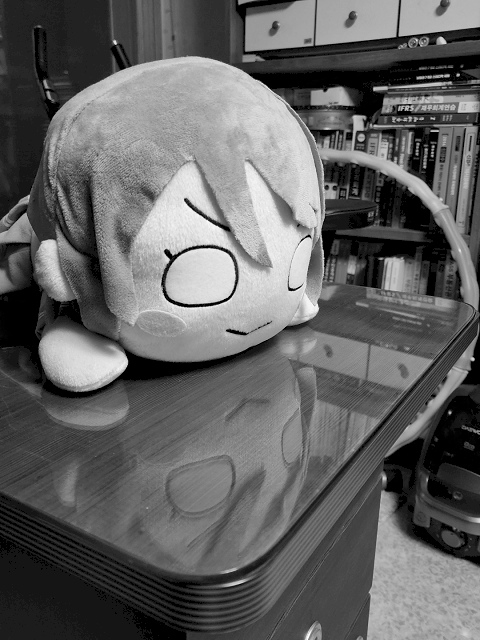

(640, 480)


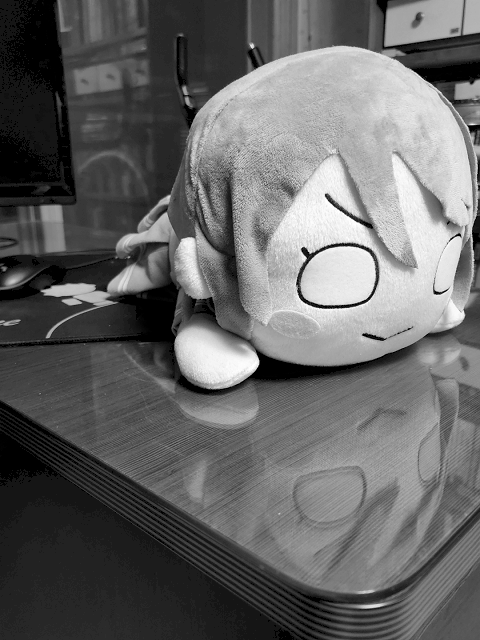

In [ ]:
print(im_src.shape)
cv_imshow(im_src)
print(im_dst.shape)
cv_imshow(im_dst)

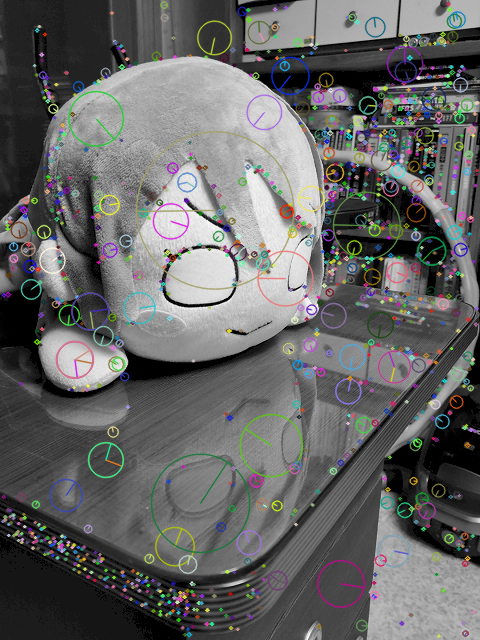

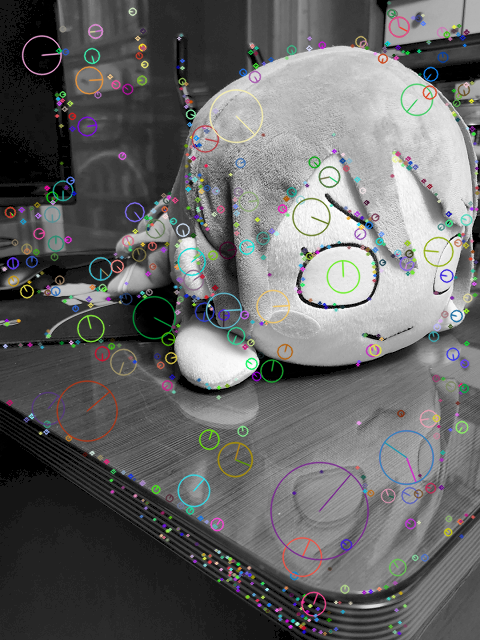

In [ ]:
sift = cv.SIFT_create()
kp1, des1 = sift.detectAndCompute(im_src,None)
kp2, des2 = sift.detectAndCompute(im_dst,None)

simg1=cv.drawKeypoints(im_src,kp1,im_src,flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv_imshow(simg1)
simg2=cv.drawKeypoints(im_dst,kp2,im_dst,flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv_imshow(simg2)

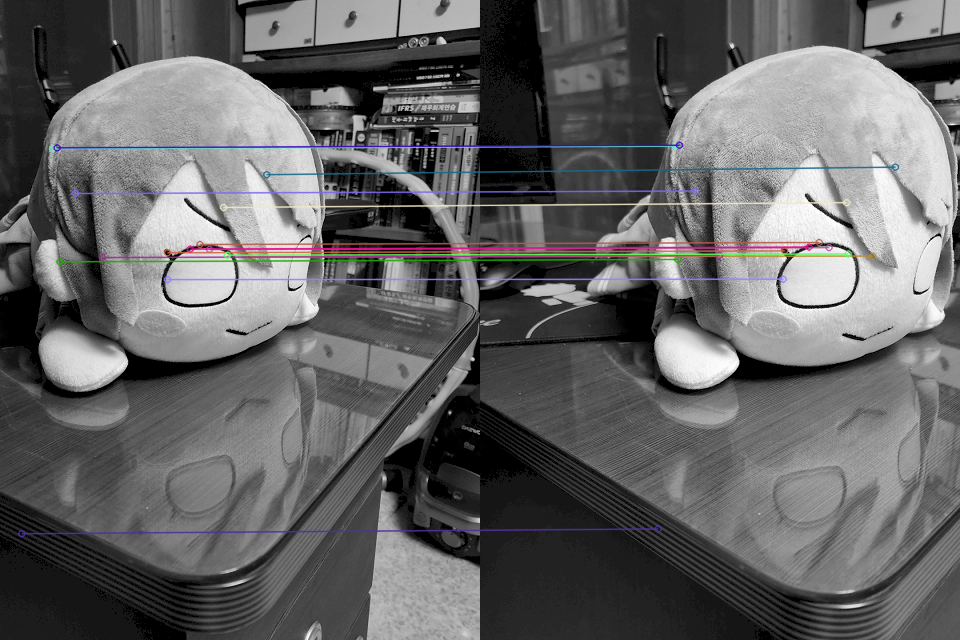

In [ ]:
bf = cv.BFMatcher()
matches = bf.match(des1,des2)
matches = sorted(matches, key = lambda x:x.distance)
img3 = cv.drawMatches(im_src, kp1, im_dst, kp2, matches[:15], None,
flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
cv_imshow(img3)

In [ ]:
pts_src = np.float32([ kp1[m.queryIdx].pt for m in matches ]).reshape(-1,1,2)
pts_dst = np.float32([ kp2[m.trainIdx].pt for m in matches ]).reshape(-1,1,2)

# Calculate Homography
h, status = cv.findHomography(pts_src, pts_dst, cv.RANSAC, 5.0)
print(h)

[[ 8.65731984e-01 -2.73754287e-02  1.48227875e+02]
 [-8.25069295e-02  9.68010004e-01  4.60444547e+00]
 [-3.52563240e-04 -1.18760961e-05  1.00000000e+00]]


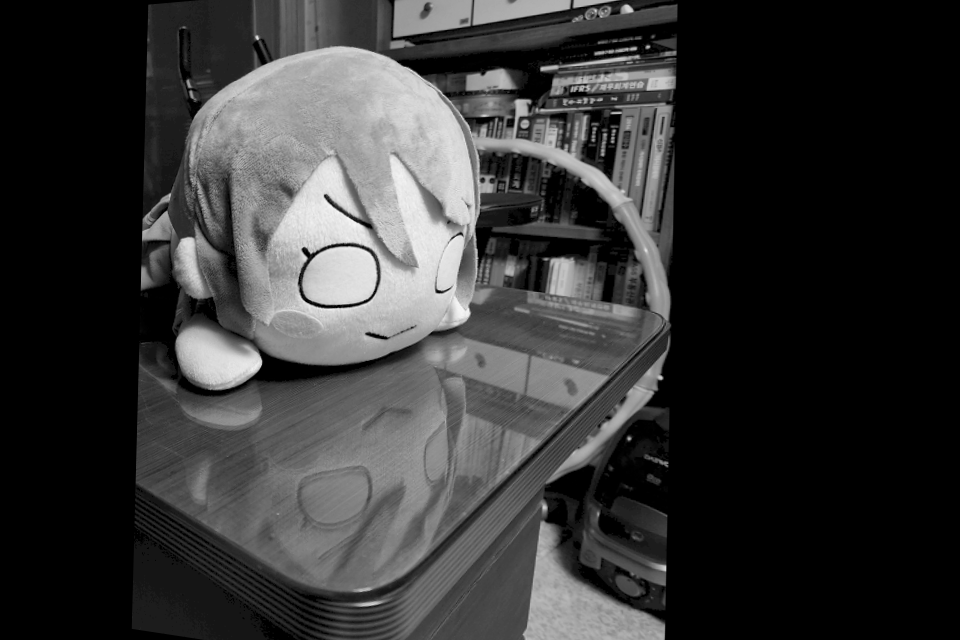

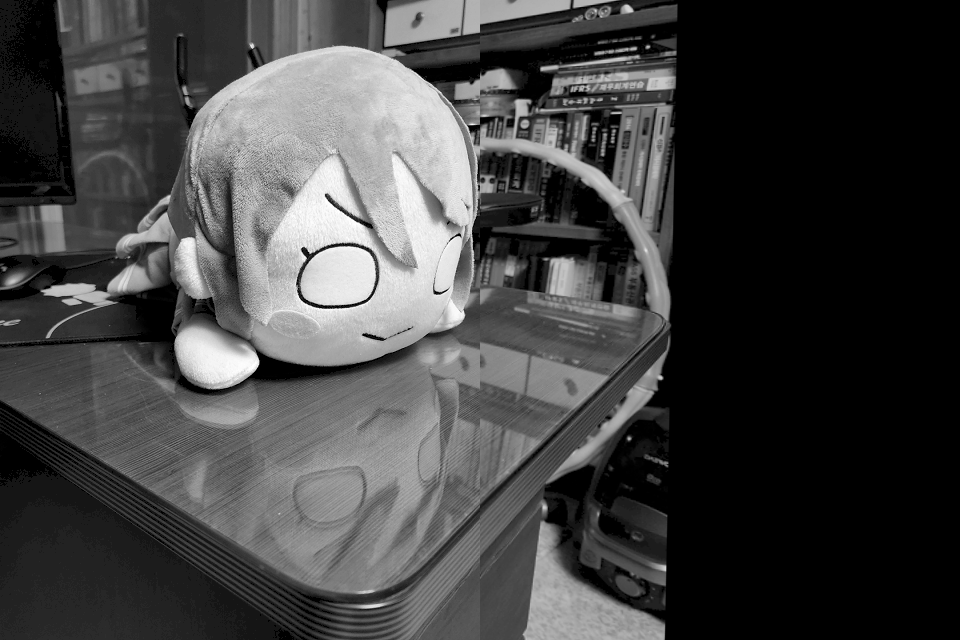

In [ ]:
im_out = cv.warpPerspective(im_src, h, (im_dst.shape[1] + im_src.shape[1], im_dst.shape[0]))
cv_imshow(im_out)
im_out[0:im_src.shape[0], 0:im_src.shape[1]] = im_dst
cv_imshow(im_out)

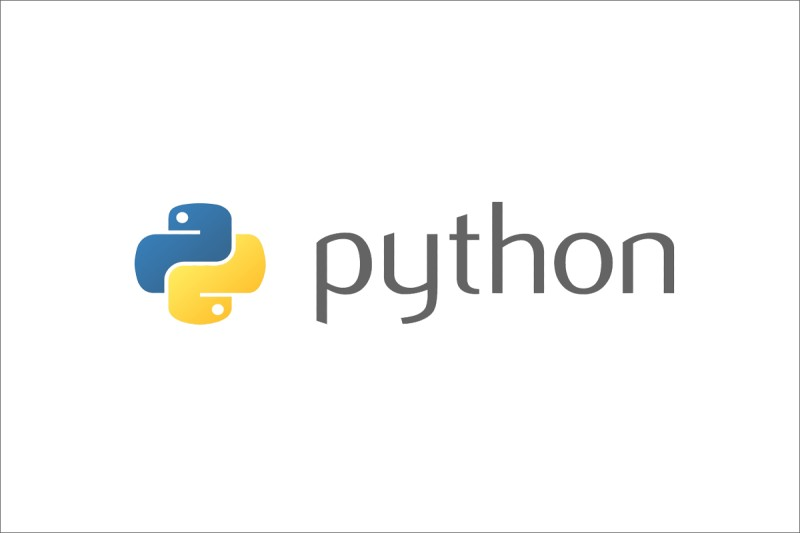

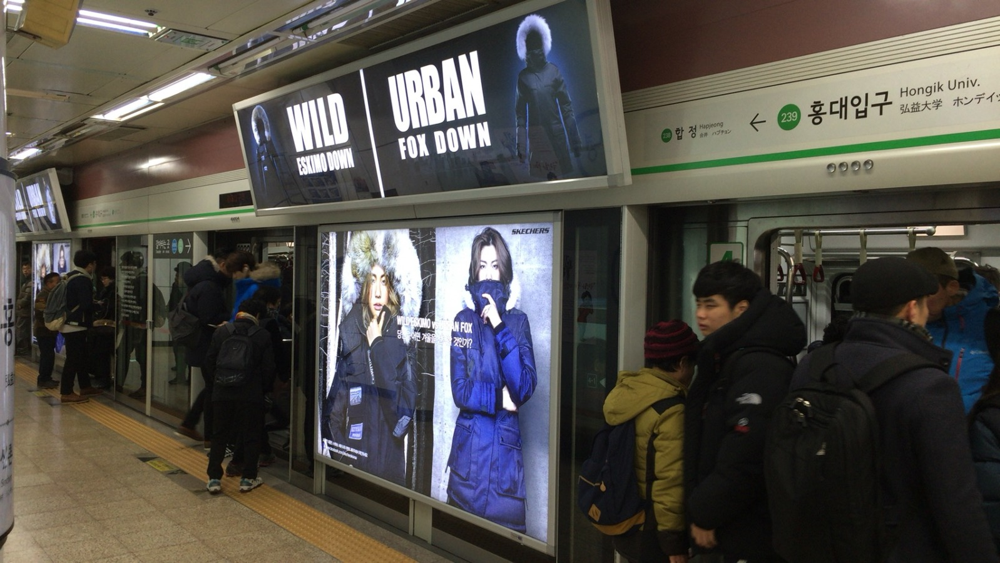

In [ ]:
# Read source image.
im = cv.imread('gdrive/MyDrive/MachineVision/as/python.jpg')
cv_imshow(im)
# Four corners of the book in source image
x = np.array([[141,131,1], [480,159,1], [493,630,1],[64,601,1]])
# Read destination image.
im_ = cv.imread('gdrive/MyDrive/MachineVision/as/subway.jpg')
cv_imshow(im_)
# Four corners of the book in destination image.
x_ = np.array([[318,256,1],[534,372,1],[316,670,1],[73,473,1]])

In [ ]:
A1 = np.hstack((np.zeros((len(x_),3)),
-np.expand_dims(x_[:,2],axis=1)*x,
np.expand_dims(x_[:,1],axis=1)*x))
A2 = np.hstack((np.expand_dims(x_[:,2],axis=1)*x,
np.zeros((len(x_),3)),
-np.expand_dims(x_[:,0],axis=1)*x))
A = np.vstack((A1, A2))
u, s, vh = np.linalg.svd(A, full_matrices=True)
h = vh[-1,:]/vh[-1,-1];
h = np.reshape(h,(3,3))
print(h)

[[ 4.34043935e-01 -4.19622184e-01  2.91709494e+02]
 [ 1.46491654e-01  4.41418278e-01  1.61369294e+02]
 [-3.62463336e-04 -9.14274844e-05  1.00000000e+00]]


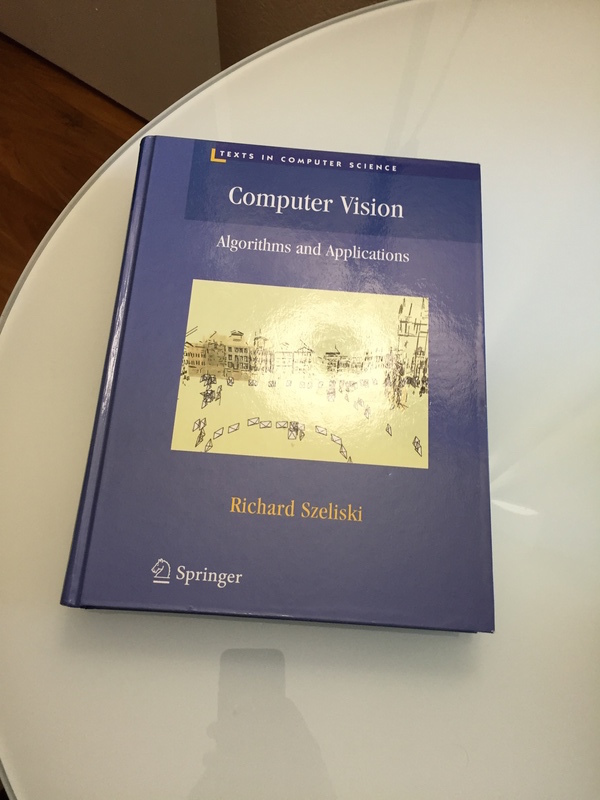

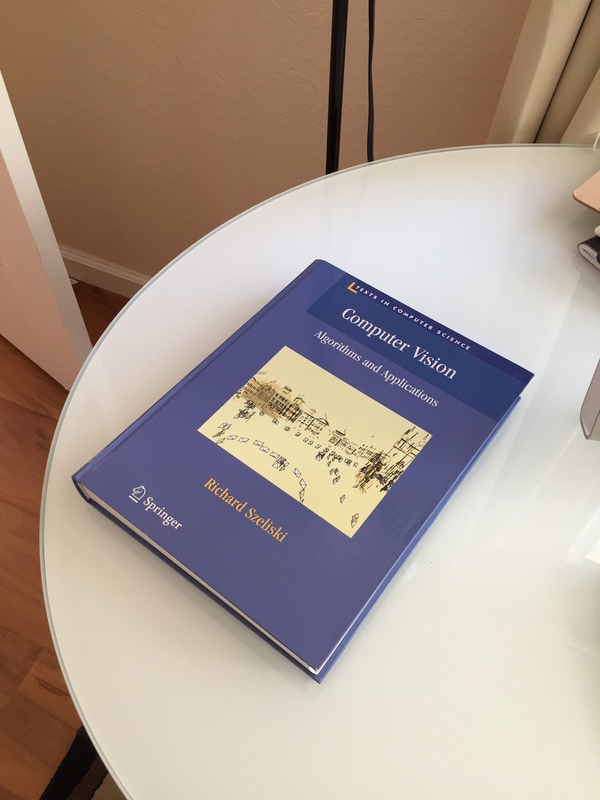

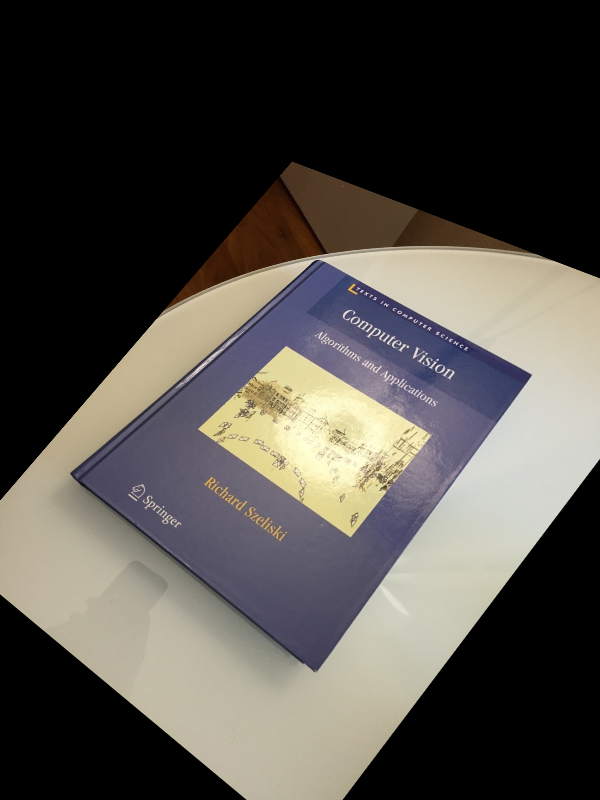

(None, None, None)

In [ ]:
# Warp source image to destination based on homography
im_out = cv.warpPerspective(im, h, (im_.shape[1],im_.shape[0]))
# Display images
cv_imshow(im), cv_imshow(im_), cv_imshow(im_out)